In [8]:
from diffusers.utils import load_image, make_image_grid
from PIL import Image
import cv2
import numpy as np


image = np.array(origin_image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)

In [6]:
!pip install diffusers


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python -m pip install --upgrade pip


In [7]:
from diffusers.utils import load_image, make_image_grid
from PIL import Image
import cv2
import numpy as np
path = '/workspace/coco/val2017/000000000785.jpg'
origin_image = Image.open(path)

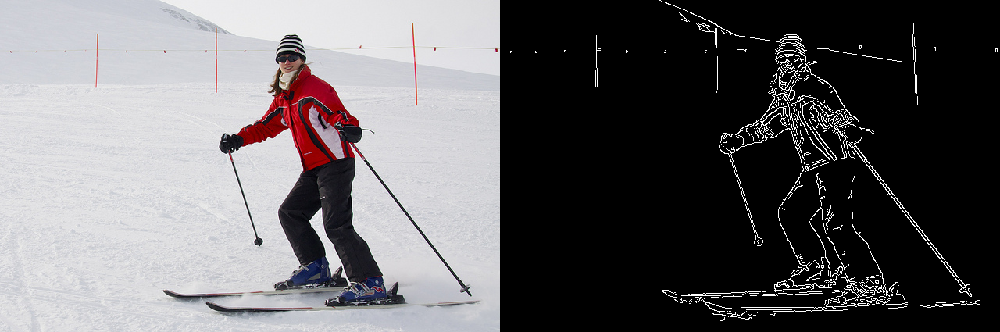

In [9]:
make_image_grid([origin_image, canny_image], rows=1, cols=2)

In [10]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16, use_safetensors=True)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True
).to('cuda')

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

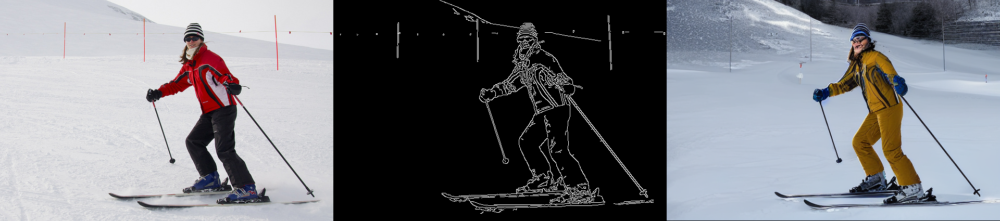

In [11]:

# Define the main (positive) prompt
positive_prompt = "a person on skis makes her way through the snow, detailed, 8k"

# Define the negative prompt to exclude unwanted elements
negative_prompt = "blurry, low quality, watermarks, deformed"


output = pipe(
    prompt=positive_prompt,negative_prompt=negative_prompt,guidance_scale=4,num_images_per_prompt=1, image=canny_image
).images[0]
make_image_grid([origin_image, canny_image, output] , rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

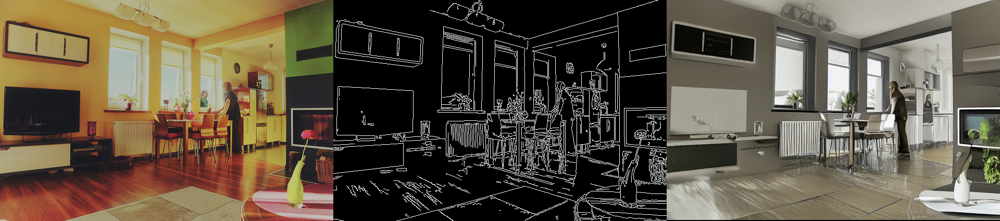

In [7]:

# Define the main (positive) prompt
positive_prompt = "a photo of a potted plant, two tv, four chair, two person,A woman standing in a kitchen by a window, a microwave, a refrigerator , two books, a clock, four vase, a dining table, detailed, 8k"

# Define the negative prompt to exclude unwanted elements
negative_prompt = "blurry, low quality, watermarks, deformed"


output = pipe(
    prompt=positive_prompt,negative_prompt=negative_prompt,guidance_scale=4,num_images_per_prompt=1, image=canny_image
).images[0]
make_image_grid([origin_image, canny_image, output] , rows=1, cols=3)

In [4]:
!pip install pycocotools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.1/165.1 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.8/427.8 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 26.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 kB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 28.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.9 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python -m pip install --upgrade pip


In [10]:
make_image_grid([origin_image, canny_image, output] , rows=1, cols=3).save('/workspace/xxx.png')

In [ ]:
import json
from PIL import Image, ImageDraw, ImageFont

# Load COCO annotations
with open(anno_path, 'r') as f:
    coco_data = json.load(f)


# Extract the image ID
image_id = int(image_path.split('/')[-1].split('.')[0])

# Extract annotations for this image
annotations = [ann for ann in coco_data['annotations'] if ann['image_id'] == image_id]

# Open the image
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

# Iterate through each annotation and draw bounding boxes with labels
for ann in annotations:
    bbox = ann['bbox']  # [x, y, width, height]
    category_id = ann['category_id']
    category_name = mscoco_category2name.get(category_id, "unknown")

    # Convert bbox format [x, y, width, height] to [x_min, y_min, x_max, y_max]
    x_min, y_min, width, height = bbox
    x_max, y_max = x_min + width, y_min + height

    # Draw bounding box
    draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)

    # Add category name
    text_position = (x_min, y_min - 10 if y_min - 10 > 0 else y_min + 10)
    draw.text(text_position, category_name, fill="blue")

# Display the image with bounding boxes and labels
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis("off")
plt.show()


In [12]:
from pycocotools.coco import COCO
caption_path = "/workspace/coco/annotations/captions_val2017.json"
caption_coco = COCO(caption_path)
img_id = 285


anno_ids = caption_coco.getAnnIds(imgIds=img_id)
anno = caption_coco.loadAnns(anno_ids[-1])[0]['caption']
print(anno)


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
A close up picture of a brown bear's face.


In [29]:
img_id = 785


anno_ids = caption_coco.getAnnIds(imgIds=img_id)
anno = caption_coco.loadAnns(anno_ids[-1])[0]['caption']
print(anno)

a person on skis makes her way through the snow


In [37]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16, use_safetensors=True)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True, safety_checker=None
).to('cuda')

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [13]:
# Mapping category ID to category name
mscoco_category2name = {
    1: "person",
    2: "bicycle",
    3: "car",
    4: "motorcycle",
    5: "airplane",
    6: "bus",
    7: "train",
    8: "truck",
    9: "boat",
    10: "traffic light",
    11: "fire hydrant",
    13: "stop sign",
    14: "parking meter",
    15: "bench",
    16: "bird",
    17: "cat",
    18: "dog",
    19: "horse",
    20: "sheep",
    21: "cow",
    22: "elephant",
    23: "bear",
    24: "zebra",
    25: "giraffe",
    27: "backpack",
    28: "umbrella",
    31: "handbag",
    32: "tie",
    33: "suitcase",
    34: "frisbee",
    35: "skis",
    36: "snowboard",
    37: "sports ball",
    38: "kite",
    39: "baseball bat",
    40: "baseball glove",
    41: "skateboard",
    42: "surfboard",
    43: "tennis racket",
    44: "bottle",
    46: "wine glass",
    47: "cup",
    48: "fork",
    49: "knife",
    50: "spoon",
    51: "bowl",
    52: "banana",
    53: "apple",
    54: "sandwich",
    55: "orange",
    56: "broccoli",
    57: "carrot",
    58: "hot dog",
    59: "pizza",
    60: "donut",
    61: "cake",
    62: "chair",
    63: "couch",
    64: "potted plant",
    65: "bed",
    67: "dining table",
    70: "toilet",
    72: "tv",
    73: "laptop",
    74: "mouse",
    75: "remote",
    76: "keyboard",
    77: "cell phone",
    78: "microwave",
    79: "oven",
    80: "toaster",
    81: "sink",
    82: "refrigerator",
    84: "book",
    85: "clock",
    86: "vase",
    87: "scissors",
    88: "teddy bear",
    89: "hair drier",
    90: "toothbrush",
}


In [16]:
import inflect
from collections import Counter
def create_prompts(target, caption):
    prompts = []
    p = inflect.engine()
    real_prompt = " photorealistic, detailed, high quality"
    ids = [obj['category_id'] for obj in target]
    names = [mscoco_category2name[id] for id in ids]
    names = Counter(names)
    for name, count in names.items():
        if count > 1 and count < 5:
            caption += p.number_to_words(count) + " (" + p.plural(name) + "), "
        elif count > 5:
            caption += "(" + p.plural(name) + "), "
        else:
            caption += "("+ name + "), "
    final_prompts = caption + real_prompt
    return final_prompts

In [15]:
!pip install inflect

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.9.0
    Uninstalling typing_extensions-4.9.0:
      Successfully uninstalled typing_extensions-4.9.0

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python -m pip install --upgrade pip


In [17]:
from PIL import Image
import numpy as np
import cv2
from diffusers.utils import load_image, make_image_grid
from pycocotools.coco import COCO

caption_path = "/workspace/coco/annotations/captions_val2017.json"
caption_coco = COCO(caption_path)
target_path = "/workspace/coco/annotations/instances_val2017.json"
target_coco = COCO(target_path)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.51s)
creating index...
index created!


  0%|          | 0/50 [00:00<?, ?it/s]

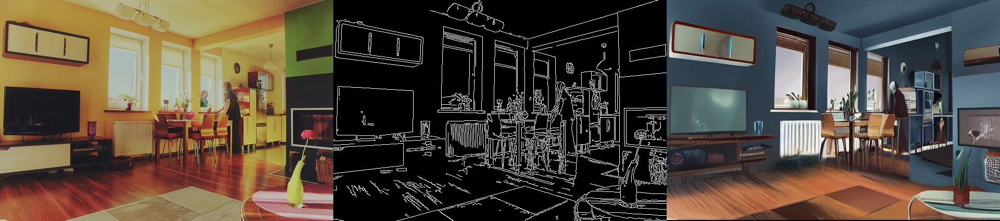

In [27]:
path = '/workspace/coco/val2017/000000000139.jpg'
origin_img1 = Image.open(path)
img1 = np.array(origin_img1)

img1 = cv2.Canny(img1, 100, 200)
img1 = img1[:, :, None]
img1 = np.concatenate([img1, img1, img1], axis=2)
canny_img1 = Image.fromarray(img1)
img_id = 139

anno_ids = caption_coco.getAnnIds(imgIds=img_id)
caption_prompt = caption_coco.loadAnns(anno_ids[0])[0]['caption']

target_ids = target_coco.getAnnIds(imgIds=img_id)
target = target_coco.loadAnns(target_ids)
positive_prompt = create_prompts(target, caption_prompt)
negative_prompt = "blurry, low quality, watermarks, deformed"


output_img1 = pipe(
    prompt=positive_prompt,negative_prompt=negative_prompt,guidance_scale=3.6,num_images_per_prompt=1, image=canny_img1
).images[0]
make_image_grid([origin_img1, canny_img1, output_img1] , rows=1, cols=3).save('/workspace/img1.png')

make_image_grid([origin_img1, canny_img1, output_img1] , rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

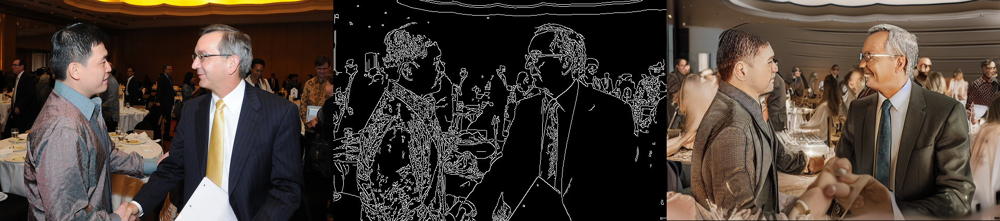

In [22]:
path = '/workspace/coco/val2017/000000004134.jpg'
origin_img1 = Image.open(path)
img1 = np.array(origin_img1)

img1 = cv2.Canny(img1, 80, 200)
img1 = img1[:, :, None]
img1 = np.concatenate([img1, img1, img1], axis=2)
canny_img1 = Image.fromarray(img1)
img_id = 4134
anno_ids = caption_coco.getAnnIds(imgIds=img_id)
caption_prompt = caption_coco.loadAnns(anno_ids[0])[0]['caption']

target_ids = target_coco.getAnnIds(imgIds=img_id)
target = target_coco.loadAnns(target_ids)
positive_prompt = create_prompts(target, caption_prompt)
negative_prompt = "blurry, low quality, watermarks, deformed"


output_img1 = pipe(
    prompt=positive_prompt,negative_prompt=negative_prompt,guidance_scale=3.6,num_images_per_prompt=1, image=canny_img1
).images[0]
make_image_grid([origin_img1, canny_img1, output_img1] , rows=1, cols=3).save('/workspace/img14.png')

make_image_grid([origin_img1, canny_img1, output_img1] , rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

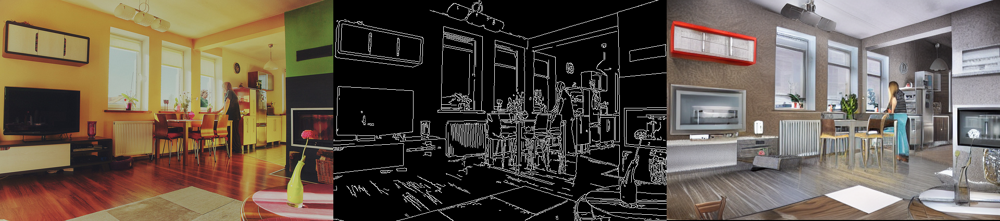

In [33]:
path = '/workspace/coco/val2017/000000000139.jpg'
origin_img1 = Image.open(path)
img1 = np.array(origin_img1)

img1 = cv2.Canny(img1, 100, 200)
img1 = img1[:, :, None]
img1 = np.concatenate([img1, img1, img1], axis=2)
canny_img1 = Image.fromarray(img1)
img_id = 139

anno_ids = caption_coco.getAnnIds(imgIds=img_id)
caption_prompt = caption_coco.loadAnns(anno_ids[0])[0]['caption']

target_ids = target_coco.getAnnIds(imgIds=img_id)
target = target_coco.loadAnns(target_ids)
positive_prompt = create_prompts(target, caption_prompt)
negative_prompt = "blurry, low quality, watermarks, deformed"


output_img1 = pipe(
    prompt=positive_prompt,negative_prompt=negative_prompt,guidance_scale=3.6,num_images_per_prompt=1, image=canny_img1
).images[0]
make_image_grid([origin_img1, canny_img1, output_img1] , rows=1, cols=3)

In [2]:
!pip install torch diffusers transformers accelerate sentencepiece opencv-python protobuf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 1.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 2.1 MB/s eta 0:00:0000:0100:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 8.4 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.4/336.4 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 13.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.7/319.7 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.5/450.5 kB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 14.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 461.3/461.3 kB 15.5 MB/s

In [32]:
anno_ids = caption_coco.getAnnIds(imgIds=img_id)
anno = caption_coco.loadAnns(anno_ids[-1])
anno

[{'image_id': 139,
  'id': 384831,
  'caption': 'A living area with a television and a table'}]

In [14]:
target_path = "/workspace/coco/annotations/instances_val2017.json"
target_coco = COCO(target_path)
target_ids = target_coco.getAnnIds(imgIds=img_id)
annotations = target_coco.loadAnns(target_ids)
annotations

loading annotations into memory...
Done (t=0.57s)
creating index...
index created!


[{'segmentation': [[240.86,
    211.31,
    240.16,
    197.19,
    236.98,
    192.26,
    237.34,
    187.67,
    245.8,
    188.02,
    243.33,
    176.02,
    250.39,
    186.96,
    251.8,
    166.85,
    255.33,
    142.51,
    253.21,
    190.49,
    261.68,
    183.08,
    258.86,
    191.2,
    260.98,
    206.37,
    254.63,
    199.66,
    252.51,
    201.78,
    251.8,
    212.01]],
  'area': 531.8071000000001,
  'iscrowd': 0,
  'image_id': 139,
  'bbox': [236.98, 142.51, 24.7, 69.5],
  'category_id': 64,
  'id': 26547},
 {'segmentation': [[9.66,
    167.76,
    156.35,
    173.04,
    153.71,
    256.48,
    82.56,
    262.63,
    7.03,
    260.87]],
  'area': 13244.657700000002,
  'iscrowd': 0,
  'image_id': 139,
  'bbox': [7.03, 167.76, 149.32, 94.87],
  'category_id': 72,
  'id': 34646},
 {'segmentation': [[563.33,
    209.19,
    637.69,
    209.19,
    638.56,
    287.92,
    557.21,
    280.04]],
  'area': 5833.117949999999,
  'iscrowd': 0,
  'image_id': 139,
  'bbox

In [18]:
create_prompts(annotations,anno_prompt)

'A living area with a television and a table(potted plant), two (tvs), (chair), two (people), (microwave), (refrigerator), two (books), (clock), four (vases), (dining table),  photorealistic, detailed, high quality'

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the original image
image_path = '/mnt/data/image.png'
image = Image.open(image_path)

# Split the image into three parts
width, height = image.size
part_width = width // 3

# Define the three images (each consisting of 3 smaller images)
img1 = image.crop((0, 0, part_width, height))
img2 = image.crop((part_width, 0, 2 * part_width, height))
img3 = image.crop((2 * part_width, 0, width, height))

# Further divide each image into three smaller images (assuming equal height split)
def split_image(img):
    sub_height = img.size[1] // 3
    return [
        img.crop((0, i * sub_height, img.size[0], (i + 1) * sub_height))
        for i in range(3)
    ]

# Split each image into smaller parts
img1_parts = split_image(img1)
img2_parts = split_image(img2)
img3_parts = split_image(img3)

# Plot the images in a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(15, 10))

# Titles for the columns
titles = ["Origin Image", "Canny Image", "Generated Image"]

# Plot each part
for row, (img_parts, label) in enumerate(zip([img1_parts, img2_parts, img3_parts], titles)):
    for col, part in enumerate(img_parts):
        axes[row, col].imshow(part)
        if row == 0:  # Add titles only for the first row
            axes[row, col].set_title(titles[col])
        axes[row, col].axis("off")

# Adjust layout and save the plot
plt.tight_layout()
output_path = '/mnt/data/three_images_grid.png'
plt.savefig(output_path)

# Display the path for the saved image
output_path


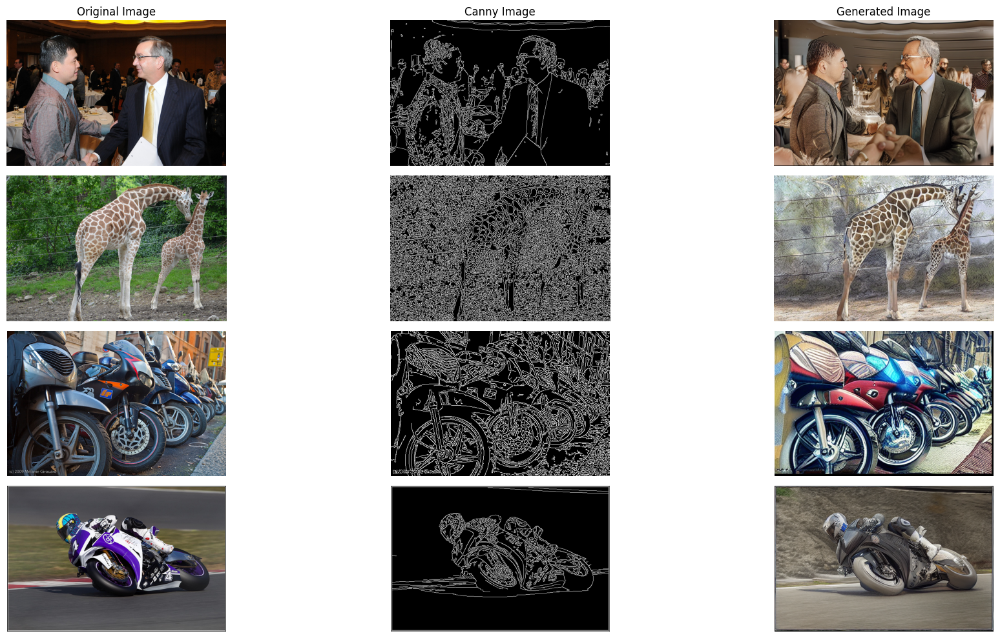

Plot saved to: /workspace/combined_images_plot_5.png


In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# File paths for the three images
file_paths = [
    '/workspace/img14.png',  # Replace with the correct file paths
    '/workspace/img10.png',
    '/workspace/img8.png',
    '/workspace/img7.png'
    
]

# Titles for the columns
titles = ["Original Image", "Canny Image", "Generated Image"]

# Create a figure with subplots (3 rows, 3 columns)
fig, axes = plt.subplots(4, 3, figsize=(20, 10))

# Iterate through each image and plot them in respective columns
for row_idx, file_path in enumerate(file_paths):
    # Load the image
    img = mpimg.imread(file_path)
    
    # Split the image into three parts (columns)
    width = img.shape[1] // 3
    for col_idx in range(3):
        start = col_idx * width
        end = (col_idx + 1) * width
        # Plot each part in its respective subplot
        axes[row_idx, col_idx].imshow(img[:, start:end])
        axes[row_idx, col_idx].axis('off')  # Turn off axis
        if row_idx == 0:  # Add column titles only for the first row
            axes[row_idx, col_idx].set_title(titles[col_idx])

# Adjust layout to avoid overlap and save the plot
plt.tight_layout()
output_path = "/workspace/combined_images_plot_5.png"
plt.savefig(output_path)  # Save the plot
plt.show()

print(f"Plot saved to: {output_path}")
